In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import kurtosis
from scipy.signal import butter, filtfilt

In [67]:
#input dir
input_dir = '/workspaces/tsunami-vtec-waves/data/'

# output dir
output_dir = '/workspaces/tsunami-vtec-waves/wave_propagation_speed/'

In [68]:
# global variables

# Time window for the event
event_time = pd.to_datetime("2011-03-11 05:46:00")
start_time = "2011-03-11 05:00:00"
end_time = "2011-03-11 08:00:00"

# Define a sliding window size 
window_size = '15min'  # 10 minutes

# epicenter
epicentre = ((38.321944, 142.368889)) # latitude, longitude -> to be adapted CRS????
epi_lat, epi_lon = epicentre



# Outline
1. Import data
2. filter for event time
3. run band pass filter
4. calculate residuals
5. analyse timeseries with curtosis for siginificant peaks (kurtosis > 3) using a sliding window
6. norm data with std and mean
7. define threshold for when wave arrives at station: kurtosis_norm > 3std
8. If threshold is passed -> wave is there, get coordinates and time
9. use horizontal distance and calculate distance to epicenter (haver sine)
10. v = ds/dt

In [69]:
# load data set and set date as index
df_raw = pd.read_csv('/workspaces/tsunami-vtec-waves/data/data_csvs/Japan_Tsunami_11Mar2011_05_07.csv')
df_raw['datetime'] = pd.to_datetime(df_raw['ut1_unix'], unit='s')
df_raw.set_index('datetime', inplace=True)

# count nans
nan_count = df_raw.isna().any().any()
if nan_count == True:
    #drop all nans
    df_raw = df_raw.dropna()
    print(f"Nan count: {nan_count}, dropped nans")

print(f"length of df_raw: {len(df_raw)}")


# filter for start and end date
df_raw = df_raw[start_time:end_time]
print(f"length of df raw within defined time window: {len(df_raw)}")



length of df_raw: 75589
length of df raw within defined time window: 75589


### Calculate residuals and add bandpass filter

In [70]:
def calculate_residuals(data, order=10):
    time_numeric = np.arange(len(data))
    poly_coeffs = np.polyfit(time_numeric, data, order)
    fitted_values = np.polyval(poly_coeffs, time_numeric)
    residuals = data - fitted_values
    return residuals

In [71]:
def bandpass_filter(data, lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    filtered_data = filtfilt(b, a, data)
    return filtered_data

In [72]:
def save_filtered_and_residuals_all(df, start_time, end_time,  filename,  tec_type,  lowcut=0.5e-3, highcut=5e-3):
    """
    Creates a new CSV file with residuals and band-pass filtered data for all ground stations and satellites.
    
    Parameters:
    - df: DataFrame containing the data.
    - start_time, end_time: Start and end time for data selection.
    - lowcut, highcut: Frequency bounds for the band-pass filter.
    - tec_type: Either 'los_tec' or 'tec' to specify the column to analyze.
    - filename: Name of the output CSV file (default is "df_filtered.csv").
    
    Returns:
    - None
    """

    # Initialize an empty DataFrame to collect all filtered data
    df_all_filtered = pd.DataFrame()

    # Loop through each unique combination of ground station and satellite
    for station_id in df['gps_site'].unique():
        for sat_id in df['sat_id'].unique():
            # Filter the data for the current station, satellite, and time range
            df_filtered = df[(df['gps_site'] == station_id) & 
                             (df['sat_id'] == sat_id)].copy()
            
            # Skip if no data is available or too few data points for filtering
            if df_filtered.empty or len(df_filtered) <= 27:
                print(f"Skipping station {station_id}, satellite {sat_id}: insufficient data points.")
                continue
            
            
            # Calculate residuals and add as a new column
            residuals = calculate_residuals(df_filtered[tec_type])
            df_filtered['residuals'] = residuals
            
            # Calculate sampling interval and apply band-pass filter
            #sampling_interval = (df_filtered.index[1] - df_filtered.index[0]).total_seconds()
            #fs = 1 / sampling_interval
            band_filtered_data = bandpass_filter(df_filtered[tec_type], lowcut, highcut, 1/30)
            df_filtered['band_filtered'] = band_filtered_data
            
            # Append the filtered data with residuals and band-pass filtered data to the main DataFrame
            df_all_filtered = pd.concat([df_all_filtered, df_filtered])

    # Save the complete filtered DataFrame to a CSV file
    df_all_filtered.to_csv(filename)
    print(f"Filtered data with residuals and band-pass filtered values saved to {filename}")
    return df_all_filtered

In [73]:
output_fn = 'Japan_tsunami_filtered.csv'
df = save_filtered_and_residuals_all(df_raw, start_time, end_time,output_dir + output_fn, tec_type="tec") 

Skipping station smst, satellite 8: insufficient data points.
Skipping station smst, satellite 28: insufficient data points.
Skipping station smst, satellite 29: insufficient data points.
Skipping station smst, satellite 6: insufficient data points.
Skipping station smst, satellite 7: insufficient data points.
Skipping station smst, satellite 10: insufficient data points.
Skipping station smst, satellite 16: insufficient data points.
Skipping station smst, satellite 23: insufficient data points.
Skipping station smst, satellite 24: insufficient data points.
Skipping station smst, satellite 1: insufficient data points.
Skipping station smst, satellite 11: insufficient data points.
Skipping station smst, satellite 14: insufficient data points.
Skipping station smst, satellite 25: insufficient data points.
Skipping station 0194, satellite 29: insufficient data points.
Skipping station 0194, satellite 6: insufficient data points.
Skipping station 0194, satellite 7: insufficient data points

In [74]:
# count amount of ground stations and satellites in contact
ground_stations = df['gps_site'].unique()
print(ground_stations)

['smst' '0194' '019b' 'aira' 'g101' 'g102' 'g103' 'g104' 'g105' 'g106'
 'g107' 'g108' 'g109' 'g110' 'g111' 'g112' 'g113' 'g114' 'g115' 'g116'
 'g117' 'g118' 'g119' 'g120' 'g122' 'g123' 'g202' 'g203' 'g204' 'g205'
 'g206' 'g207' 'g208' 'g209' 'g211' 'jlhc' 'kgni' 'ksmv' 'mizu' 'mtka'
 'suiy' 'tsk2' 'tskb' 'usud']


In [75]:
def station_sat_dic_builder(gs_id:list, df, event_time):
    gs_sat = {}
    for i in gs_id:
        gs_sat[i] = get_satellites_in_contact(df,i,event_time)
    return gs_sat

def get_satellites_in_contact(df, station_id, event_time):
    """
    Check which satellites were in contact with groundstationd during event time
    
    In: Dataframe, ground station id, eventtime
    Out: List of satellite ids which were in contact during event time

    """
    df_filtered = df[(df['gps_site'] == station_id) & (df.index == event_time)]
    satellites_in_contact = df_filtered['sat_id'].unique()

    return satellites_in_contact.tolist()

def count_sat_in_contact(dictionary):
    """
    Count how many satellites were in contact with groundstation
    
    In: dictionary with groundstation id as key and list of satellites in contact as value
    Out: values with amount of satellites in contact with all groundstations
    """
    amount = 0
    for i in dictionary.values():
        amount += len(i)
    return amount


In [76]:
# build dictionary of groundstation and list of satellites in contact with gs at event_time
sat_data = station_sat_dic_builder(ground_stations,df_raw,event_time)

#count amount of satellites in contact with each groundstation
sat_in_contact = count_sat_in_contact(sat_data)
print(f"amount of satellites in contact with different GS: {sat_in_contact}")

amount of satellites in contact with different GS: 343


### Peak detection
Per sat per groundstation over the rolling window:
- calculate kurtosis $\to$ using scipy (deactivating Fisher $\to$ not calculating excess kurtosis)
- normalize kurtosis
- std of kurtosis

Peak: if kurtosis_norm > 3 std

In [77]:
# Function to calculate rolling kurtosis
# calculate kurtosis with scipy (https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kurtosis.html)

def calculate_kurtosis(group):
    return group['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)

In [78]:
def kurtosis_wrapper(x):
    return kurtosis(x, fisher=False, bias=False, nan_policy='omit')

In [79]:
def first_peak_detection(df):
    #initalize counter
    counter = 0

    # initialize new column 'first_peak' with False
    df['first_peak'] = False

    # Reindex df from datetime to integer to handle any duplicate timestamps
    #df = df.reset_index(drop=False)
    
    # Find the first peak after the event_time
    mask = (df['peak'] == True) & (df.index > pd.to_datetime(event_time))
    
    if not mask.any():
        print('No peak detected after the event')

        return df, counter
    
    
    # get row where first peak after the event appears
    first_peak_idx = df[(df['peak'] == True) & (df.index > event_time)].index[0]
    if pd.notna(first_peak_idx):
        # set the column df['first_peak'] = True for the first peak after the event
        df.loc[first_peak_idx, 'first_peak'] = True
        counter += 1

    # set datetime as index again
    #df = df.set_index('datetime')
    #print(df[df['first_peak'] == True])

    #assert that only one peak detected (one peak per satellite)
    assert counter <= 1, "More than one peak detected"
    

    return df,counter

In [ ]:
def peak_detection(df, gs:list,window_size:str,event_time):
    """
    Detect peaks using kurtosis:
    iterate through satellite per groundstaiton and calculate:
    rolling kurtosis, normalized kurtosis, rolling std of normalized kurtosis
    detect peaks if normalized curtosis > std(norm kurtosis)
    differentiate between first and max peak.
    
    Parameters:
    - df: DataFrame containing the data.
    - gs: List of ground stations to analyze.
    - windowsize: Size of the rolling window for kurtosis calculation.
    - eventtime: Time of the event.
    
    Returns:
    - df: Updated DataFrame with a new column 'peak', 'max_peak' and 'first_peak' indicating the presence of a peak.
    - number_of_first_peaks: Number of first peaks detected.
    """
    #initalize
    results = []
    number_of_first_peaks = 0

    for station in gs:
        for sat_id in sat_data[station]:
            df_sat = df[(df['gps_site'] == station) & (df['sat_id'] == sat_id)]
            #df_sat.loc[(df_sat['gps_site'] == station) & (df_sat['sat_id'] == sat_id), 'kurtosis'] = df_sat.loc[(df_sat['gps_site'] == station) & (df_sat['sat_id'] == sat_id), 'residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
            df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
        
            # normalize kurtosis
            df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
            #nan assertion
            #assert not df_sat['kurtosis_norm'].isnull().values.any(), "NaN values in normalized kurtosis"

            # add rolling standard deviation of normalized kurtosis
            df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
            #nan assertion
            #assert not df_sat['kurtosis_norm_std'].isnull().values.any(), "NaN values in normalized kurtosis std"

            # drop Nan for correct peak detection
            df_sat = df_sat.dropna()


            # detect peaks after event time: Peak if kurtosis_norm > 2*std and time > event_time
            df_sat['peak'] = (df_sat['kurtosis_norm'] > 3*df_sat['kurtosis_norm_std']) & (df_sat.index > event_time)

            # max peak detection: Max if over whole data set highest kurtosis_norm and time > event_time
            df_sat['max_peak'] = (df_sat['kurtosis_norm'] == df_sat['kurtosis_norm'].max()) & (df_sat.index > event_time) 
            #print(f"length of df_sat after max: {len(df_sat)}")

            # first peak detection
            df_sat, counter = first_peak_detection(df_sat)
            #print(f"length of df_sat after first: {len(df_sat)}")
            
            # count number of first peaks
            number_of_first_peaks += counter

            # store results
            results.append(df_sat)

    # store all restuls in one dataframe        
    df_results = pd.concat(results)
    return df_results, number_of_first_peaks


In [89]:
kurtosis_df, number_of_first_peaks = peak_detection(df.copy(), ground_stations, window_size, event_time)

/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 155
No peak detected after the event
length of df_sat after first: 155
length of df_sat after max: 231
length of df_sat after first: 231


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 231
length of df_sat after first: 231
length of df_sat after max: 211
length of df_sat after first: 211
length of df_sat after max: 231
length of df_sat after first: 231


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 218
length of df_sat after first: 218
length of df_sat after max: 231
No peak detected after the event
length of df_sat after first: 231


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 188
length of df_sat after first: 188
length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 224
length of df_sat after first: 224


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 224
No peak detected after the event
length of df_sat after first: 224


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 203
length of df_sat after first: 203


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 188
length of df_sat after first: 188
length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 224
length of df_sat after first: 224


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 224
No peak detected after the event
length of df_sat after first: 224
length of df_sat after max: 224
length of df_sat after first: 224


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 203
length of df_sat after first: 203
length of df_sat after max: 148
length of df_sat after first: 148


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 123
length of df_sat after first: 123


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 218
length of df_sat after first: 218
length of df_sat after max: 223
length of df_sat after first: 223
length of df_sat after max: 162
length of df_sat after first: 162


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 223
length of df_sat after first: 223
length of df_sat after max: 223
length of df_sat after first: 223
length of df_sat after max: 223
length of df_sat after first: 223
length of df_sat after max: 175
length of df_sat after first: 175


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 230
length of df_sat after first: 230
length of df_sat after max: 230
length of df_sat after first: 230


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 218
length of df_sat after first: 218
length of df_sat after max: 230
length of df_sat after first: 230
length of df_sat after max: 230
length of df_sat after first: 230


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 230
length of df_sat after first: 230
length of df_sat after max: 220
length of df_sat after first: 220


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 213
length of df_sat after first: 213
length of df_sat after max: 213
length of df_sat after first: 213
length of df_sat after max: 213
length of df_sat after first: 213


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 213
length of df_sat after first: 213
length of df_sat after max: 213
length of df_sat after first: 213
length of df_sat after max: 213
length of df_sat after first: 213
length of df_sat after max: 159
length of df_sat after first: 159


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 167
length of df_sat after first: 167
length of df_sat after max: 233
length of df_sat after first: 233


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 233
length of df_sat after first: 233
length of df_sat after max: 233
length of df_sat after first: 233
length of df_sat after max: 233
length of df_sat after first: 233


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 233
length of df_sat after first: 233
length of df_sat after max: 233
length of df_sat after first: 233


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 210
length of df_sat after first: 210
length of df_sat after max: 156
length of df_sat after first: 156
length of df_sat after max: 188
length of df_sat after first: 188
length of df_sat after max: 188
length of df_sat after first: 188


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 188
length of df_sat after first: 188
length of df_sat after max: 188
length of df_sat after first: 188
length of df_sat after max: 188
length of df_sat after first: 188


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 188
length of df_sat after first: 188
length of df_sat after max: 160
length of df_sat after first: 160
length of df_sat after max: 87
No peak detected after the event
length of df_sat after first: 87
length of df_sat after max: 87
No peak detected after the event
length of df_sat after first: 87


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 87
No peak detected after the event
length of df_sat after first: 87
length of df_sat after max: 87
No peak detected after the event
length of df_sat after first: 87
length of df_sat after max: 87
No peak detected after the event
length of df_sat after first: 87
length of df_sat after max: 87
No peak detected after the event
length of df_sat after first: 87
length of df_sat after max: 87
No peak detected after the event
length of df_sat after first: 87


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 87
No peak detected after the event
length of df_sat after first: 87
length of df_sat after max: 209
length of df_sat after first: 209
length of df_sat after max: 233
No peak detected after the event
length of df_sat after first: 233


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 233
length of df_sat after first: 233
length of df_sat after max: 232
length of df_sat after first: 232


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 233
length of df_sat after first: 233
length of df_sat after max: 233
length of df_sat after first: 233
length of df_sat after max: 233
length of df_sat after first: 233


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 179
length of df_sat after first: 179
length of df_sat after max: 192
length of df_sat after first: 192
length of df_sat after max: 218
length of df_sat after first: 218


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 218
length of df_sat after first: 218
length of df_sat after max: 218
length of df_sat after first: 218
length of df_sat after max: 218
length of df_sat after first: 218


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 218
No peak detected after the event
length of df_sat after first: 218
length of df_sat after max: 187
length of df_sat after first: 187
length of df_sat after max: 228
length of df_sat after first: 228
length of df_sat after max: 228
length of df_sat after first: 228


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 228
No peak detected after the event
length of df_sat after first: 228
length of df_sat after max: 228
No peak detected after the event
length of df_sat after first: 228


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 228
No peak detected after the event
length of df_sat after first: 228
length of df_sat after max: 228
No peak detected after the event
length of df_sat after first: 228
length of df_sat after max: 185
No peak detected after the event
length of df_sat after first: 185


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 147
No peak detected after the event
length of df_sat after first: 147
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184
length of df_sat after max: 147
length of df_sat after first: 147
length of df_sat after max: 177
length of df_sat after first: 177
length of df_sat after max: 192
length of df_sat after first: 192


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 229
No peak detected after the event
length of df_sat after first: 229
length of df_sat after max: 229
length of df_sat after first: 229
length of df_sat after max: 118
length of df_sat after first: 118


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 229
length of df_sat after first: 229
length of df_sat after max: 229
length of df_sat after first: 229
length of df_sat after max: 177
length of df_sat after first: 177


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 188
length of df_sat after first: 188
length of df_sat after max: 229
length of df_sat after first: 229


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 229
No peak detected after the event
length of df_sat after first: 229
length of df_sat after max: 229
No peak detected after the event
length of df_sat after first: 229


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 229
No peak detected after the event
length of df_sat after first: 229
length of df_sat after max: 229
length of df_sat after first: 229
length of df_sat after max: 229
No peak detected after the event
length of df_sat after first: 229


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 166
length of df_sat after first: 166
length of df_sat after max: 116
length of df_sat after first: 116
length of df_sat after max: 234
length of df_sat after first: 234
length of df_sat after max: 234
length of df_sat after first: 234


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184
length of df_sat after max: 234
length of df_sat after first: 234
length of df_sat after max: 234
length of df_sat after first: 234


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 234
No peak detected after the event
length of df_sat after first: 234
length of df_sat after max: 174
length of df_sat after first: 174
length of df_sat after max: 131
length of df_sat after first: 131


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 226
length of df_sat after first: 226
length of df_sat after max: 226
length of df_sat after first: 226
length of df_sat after max: 226
No peak detected after the event
length of df_sat after first: 226
length of df_sat after max: 226
No peak detected after the event
length of df_sat after first: 226


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 226
length of df_sat after first: 226
length of df_sat after max: 226
length of df_sat after first: 226
length of df_sat after max: 140
No peak detected after the event
length of df_sat after first: 140
length of df_sat after max: 162
length of df_sat after first: 162


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 134
No peak detected after the event
length of df_sat after first: 134


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 199
length of df_sat after first: 199
length of df_sat after max: 232
length of df_sat after first: 232


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 232
length of df_sat after first: 232
length of df_sat after max: 232
length of df_sat after first: 232


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 232
length of df_sat after first: 232
length of df_sat after max: 232
length of df_sat after first: 232
length of df_sat after max: 131
No peak detected after the event
length of df_sat after first: 131
length of df_sat after max: 161
length of df_sat after first: 161


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 226
No peak detected after the event
length of df_sat after first: 226
length of df_sat after max: 226
length of df_sat after first: 226
length of df_sat after max: 226
length of df_sat after first: 226


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 226
No peak detected after the event
length of df_sat after first: 226
length of df_sat after max: 226
length of df_sat after first: 226
length of df_sat after max: 226
length of df_sat after first: 226


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 141
length of df_sat after first: 141
length of df_sat after max: 162
length of df_sat after first: 162
length of df_sat after max: 220
length of df_sat after first: 220


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 220
No peak detected after the event
length of df_sat after first: 220
length of df_sat after max: 220
length of df_sat after first: 220
length of df_sat after max: 220
length of df_sat after first: 220


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 220
length of df_sat after first: 220
length of df_sat after max: 220
length of df_sat after first: 220
length of df_sat after max: 103
length of df_sat after first: 103
length of df_sat after max: 134
length of df_sat after first: 134


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 235
length of df_sat after first: 235
length of df_sat after max: 235
length of df_sat after first: 235


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 235
length of df_sat after first: 235
length of df_sat after max: 235
No peak detected after the event
length of df_sat after first: 235
length of df_sat after max: 225
length of df_sat after first: 225


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 235
length of df_sat after first: 235
length of df_sat after max: 104
No peak detected after the event
length of df_sat after first: 104
length of df_sat after max: 226
No peak detected after the event
length of df_sat after first: 226


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 226
length of df_sat after first: 226
length of df_sat after max: 226
length of df_sat after first: 226
length of df_sat after max: 226
length of df_sat after first: 226


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 174
length of df_sat after first: 174
length of df_sat after max: 226
length of df_sat after first: 226
length of df_sat after max: 154
length of df_sat after first: 154


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 224
length of df_sat after first: 224


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 224
length of df_sat after first: 224
length of df_sat after max: 224
length of df_sat after first: 224


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 97
length of df_sat after first: 97
length of df_sat after max: 173
length of df_sat after first: 173
length of df_sat after max: 222
No peak detected after the event
length of df_sat after first: 222
length of df_sat after max: 222
length of df_sat after first: 222


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 211
length of df_sat after first: 211
length of df_sat after max: 222
length of df_sat after first: 222
length of df_sat after max: 178
length of df_sat after first: 178
length of df_sat after max: 232
length of df_sat after first: 232


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 232
length of df_sat after first: 232
length of df_sat after max: 232
length of df_sat after first: 232


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 232
length of df_sat after first: 232
length of df_sat after max: 232
length of df_sat after first: 232
length of df_sat after max: 232
length of df_sat after first: 232


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 232
length of df_sat after first: 232
length of df_sat after max: 187
length of df_sat after first: 187


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 227
length of df_sat after first: 227
length of df_sat after max: 227
length of df_sat after first: 227
length of df_sat after max: 227
length of df_sat after first: 227


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 227
length of df_sat after first: 227
length of df_sat after max: 227
length of df_sat after first: 227
length of df_sat after max: 227
length of df_sat after first: 227


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 227
length of df_sat after first: 227
length of df_sat after max: 179
length of df_sat after first: 179
length of df_sat after max: 223
length of df_sat after first: 223


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 223
length of df_sat after first: 223
length of df_sat after max: 223
No peak detected after the event
length of df_sat after first: 223
length of df_sat after max: 223
length of df_sat after first: 223


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 223
length of df_sat after first: 223
length of df_sat after max: 223
length of df_sat after first: 223
length of df_sat after max: 221
length of df_sat after first: 221


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 137
No peak detected after the event
length of df_sat after first: 137
length of df_sat after max: 137
length of df_sat after first: 137
length of df_sat after max: 137
No peak detected after the event
length of df_sat after first: 137


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 137
length of df_sat after first: 137
length of df_sat after max: 137
length of df_sat after first: 137
length of df_sat after max: 137
length of df_sat after first: 137
length of df_sat after max: 137
No peak detected after the event
length of df_sat after first: 137


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 137
length of df_sat after first: 137
length of df_sat after max: 200
length of df_sat after first: 200
length of df_sat after max: 231
length of df_sat after first: 231


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 231
length of df_sat after first: 231
length of df_sat after max: 231
length of df_sat after first: 231


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 231
length of df_sat after first: 231
length of df_sat after max: 231
length of df_sat after first: 231
length of df_sat after max: 231
length of df_sat after first: 231


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 168
length of df_sat after first: 168
length of df_sat after max: 176
length of df_sat after first: 176
length of df_sat after max: 216
length of df_sat after first: 216
length of df_sat after max: 216
length of df_sat after first: 216


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 216
No peak detected after the event
length of df_sat after first: 216
length of df_sat after max: 216
No peak detected after the event
length of df_sat after first: 216
length of df_sat after max: 216
length of df_sat after first: 216


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 216
length of df_sat after first: 216
length of df_sat after max: 161
No peak detected after the event
length of df_sat after first: 161
length of df_sat after max: 166
length of df_sat after first: 166


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 217
length of df_sat after first: 217
length of df_sat after max: 217
length of df_sat after first: 217
length of df_sat after max: 217
length of df_sat after first: 217


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 217
length of df_sat after first: 217
length of df_sat after max: 217
length of df_sat after first: 217
length of df_sat after max: 217
length of df_sat after first: 217


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 79
length of df_sat after first: 79
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 233
No peak detected after the event
length of df_sat after first: 233


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 233
length of df_sat after first: 233
length of df_sat after max: 223
length of df_sat after first: 223
length of df_sat after max: 233
length of df_sat after first: 233


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 233
No peak detected after the event
length of df_sat after first: 233
length of df_sat after max: 233
length of df_sat after first: 233
length of df_sat after max: 103
No peak detected after the event
length of df_sat after first: 103


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 203
length of df_sat after first: 203
length of df_sat after max: 203
length of df_sat after first: 203
length of df_sat after max: 203
length of df_sat after first: 203


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 203
No peak detected after the event
length of df_sat after first: 203
length of df_sat after max: 203
length of df_sat after first: 203
length of df_sat after max: 133
length of df_sat after first: 133


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 119
length of df_sat after first: 119
length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184
length of df_sat after max: 219
length of df_sat after first: 219


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 370
length of df_sat after first: 370
length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184
length of df_sat after max: 133
length of df_sat after first: 133


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184
length of df_sat after max: 116
No peak detected after the event
length of df_sat after first: 116


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 123
No peak detected after the event
length of df_sat after first: 123
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 157
length of df_sat after first: 157


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 177
length of df_sat after first: 177
length of df_sat after max: 151
length of df_sat after first: 151
length of df_sat after max: 179
No peak detected after the event
length of df_sat after first: 179


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 181
length of df_sat after first: 181
length of df_sat after max: 178
No peak detected after the event
length of df_sat after first: 178
length of df_sat after max: 89
length of df_sat after first: 89
length of df_sat after max: 74
No peak detected after the event
length of df_sat after first: 74
length of df_sat after max: 74
No peak detected after the event
length of df_sat after first: 74


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 74
No peak detected after the event
length of df_sat after first: 74
length of df_sat after max: 74
No peak detected after the event
length of df_sat after first: 74
length of df_sat after max: 74
No peak detected after the event
length of df_sat after first: 74
length of df_sat after max: 91
length of df_sat after first: 91
length of df_sat after max: 91
length of df_sat after first: 91


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 91
length of df_sat after first: 91
length of df_sat after max: 91
No peak detected after the event
length of df_sat after first: 91
length of df_sat after max: 91
length of df_sat after first: 91
length of df_sat after max: 91
length of df_sat after first: 91
length of df_sat after max: 91
length of df_sat after first: 91


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 91
length of df_sat after first: 91
length of df_sat after max: 145
length of df_sat after first: 145
length of df_sat after max: 167
length of df_sat after first: 167


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 180
length of df_sat after first: 180
length of df_sat after max: 164
length of df_sat after first: 164
length of df_sat after max: 167
length of df_sat after first: 167
length of df_sat after max: 164
length of df_sat after first: 164


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 165
length of df_sat after first: 165
length of df_sat after max: 167
length of df_sat after first: 167
length of df_sat after max: 167
length of df_sat after first: 167


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 124
No peak detected after the event
length of df_sat after first: 124
length of df_sat after max: 116
length of df_sat after first: 116
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 199
No peak detected after the event
length of df_sat after first: 199


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 370
length of df_sat after first: 370
length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 178
length of df_sat after first: 178


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 135
length of df_sat after first: 135
length of df_sat after max: 162
length of df_sat after first: 162


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 147
length of df_sat after first: 147
length of df_sat after max: 153
length of df_sat after first: 153
length of df_sat after max: 184
length of df_sat after first: 184


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
No peak detected after the event
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 147
No peak detected after the event
length of df_sat after first: 147
length of df_sat after max: 74
No peak detected after the event
length of df_sat after first: 74


/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm'] = (df_sat['kurtosis'] - df_sat['kurtosis'].mean()) / df_sat['kurtosis'].std()
/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 163
No peak detected after the event
length of df_sat after first: 163


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 184
length of df_sat after first: 184


/tmp/ipykernel_5755/2884158267.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis_norm_std'] = df_sat['kurtosis_norm'].rolling(window=window_size).std()
/tmp/ipykernel_5755/2884158267.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sat['kurtosis'] = df_sat['residuals'].rolling(window=window_size).apply(kurtosis_wrapper, raw=True)
/tmp/ipykernel_5755/2884158267.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

length of df_sat after max: 184
length of df_sat after first: 184
length of df_sat after max: 141
length of df_sat after first: 141


### Plot data

In [90]:
def plot_kortosis_peaks(gs:list, save_fig=False):
    # plot different peaks
    for station in gs:
        fig, ax = plt.subplots(figsize=(15, 5))
        for sat_id in sat_data[station]:
            df = kurtosis_df[(kurtosis_df['gps_site'] == station) & (kurtosis_df['sat_id'] == sat_id)]
            df.plot(y='kurtosis_norm', ax=ax, label=f'{station}, sat {sat_id}')
            # plot all peaks
            df[df['peak']].plot(y='kurtosis_norm', ax=ax, style='o', label=f'{station}, sat {sat_id} peak', color= 'b', markersize = 5,alpha=0.7)
            #plot max peaks
            df[df['max_peak']].plot(y='kurtosis_norm', ax=ax, style='o', label=f'{station}, sat {sat_id} max peak', color='g', markersize = 5,alpha=0.7)
            #plot first peaks
            df[df['first_peak'] == True].plot(y='kurtosis_norm', ax=ax, style='o', label=f'{station}, sat {sat_id} first peak', color='r', markersize=5,alpha=0.7)
        plt.axvline(x=event_time, color='r', linestyle='--')
        ax.set_xlabel("Time")
        ax.set_ylabel("Normalized kurtosis")
        plt.title(f'Normalized kurtosis of residuals of ground station "{station}" over rolling window of {window_size} with peaks (kurtosis > 3 std)')
        plt.show()
        #save to folder wave propagation speed 
        if save_fig:
            fig.savefig(f"{output_dir}/kurtosis_n_{station}_peak.png")
        

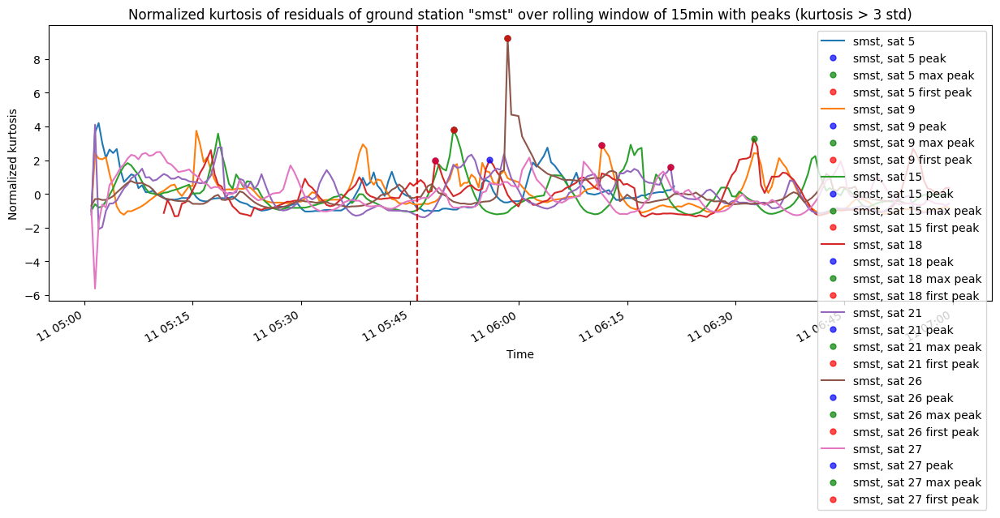

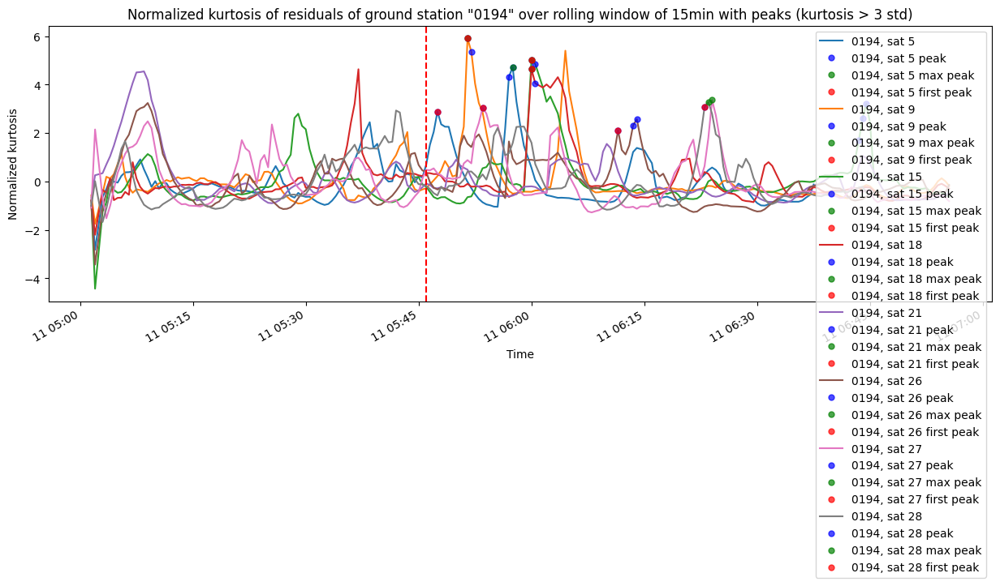

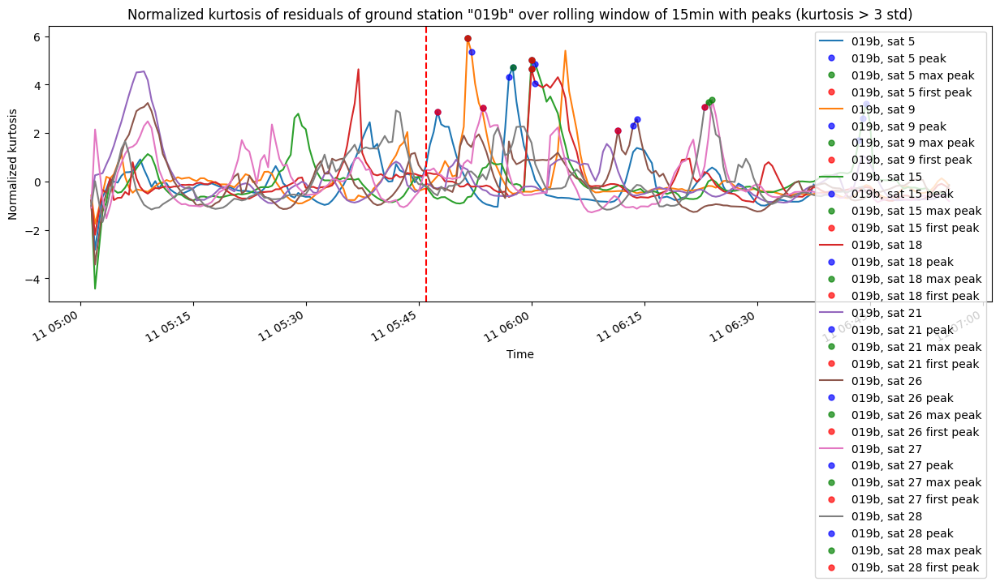

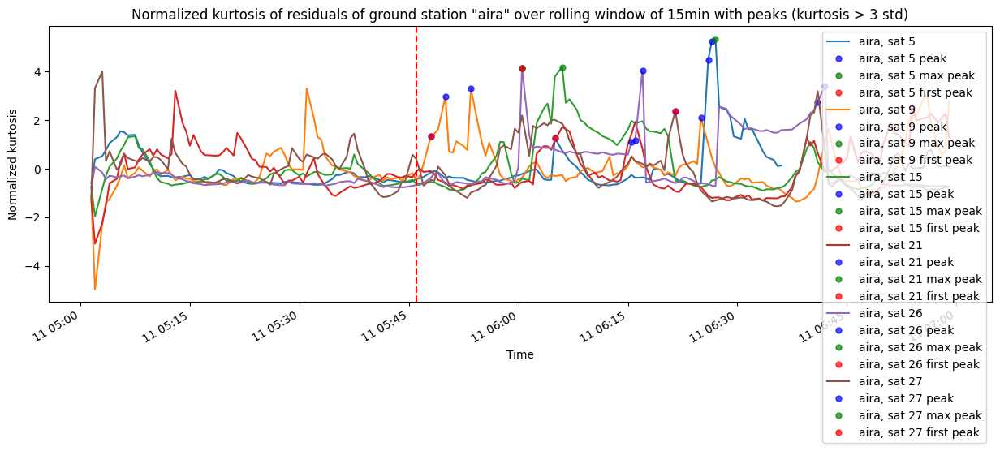

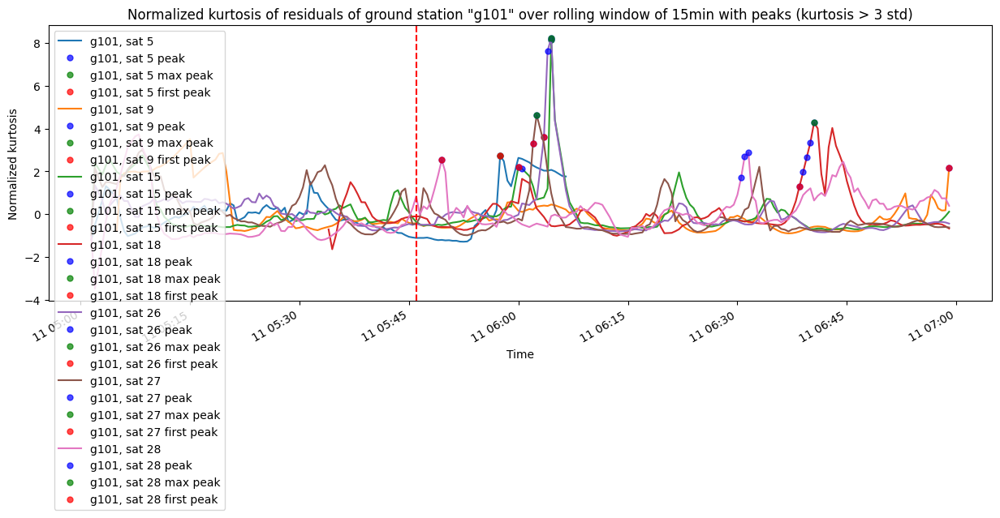

...

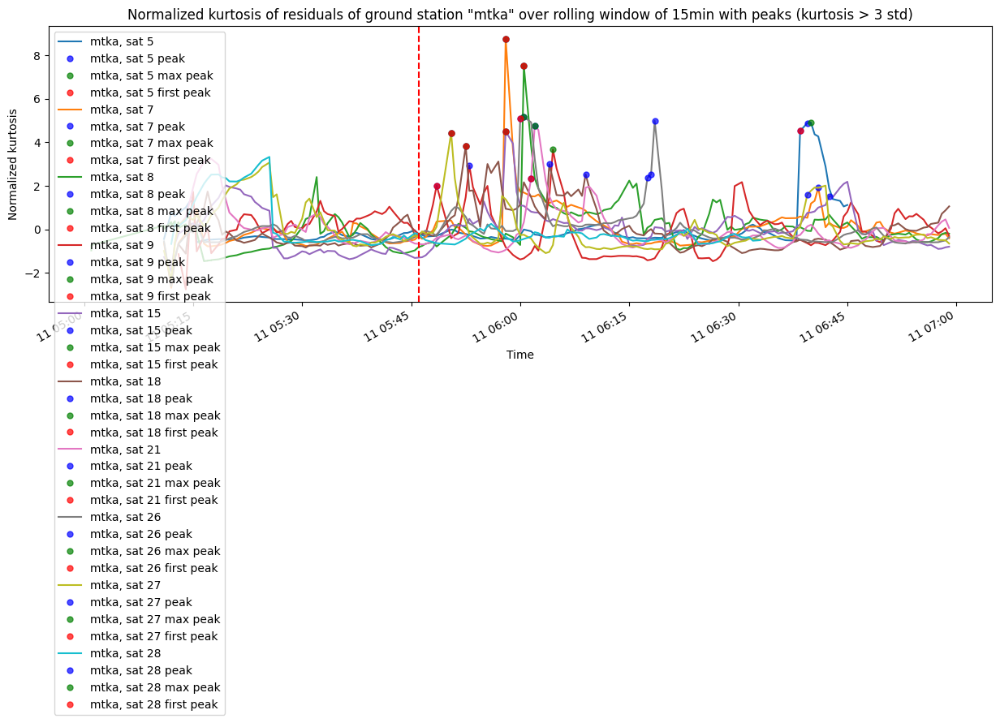

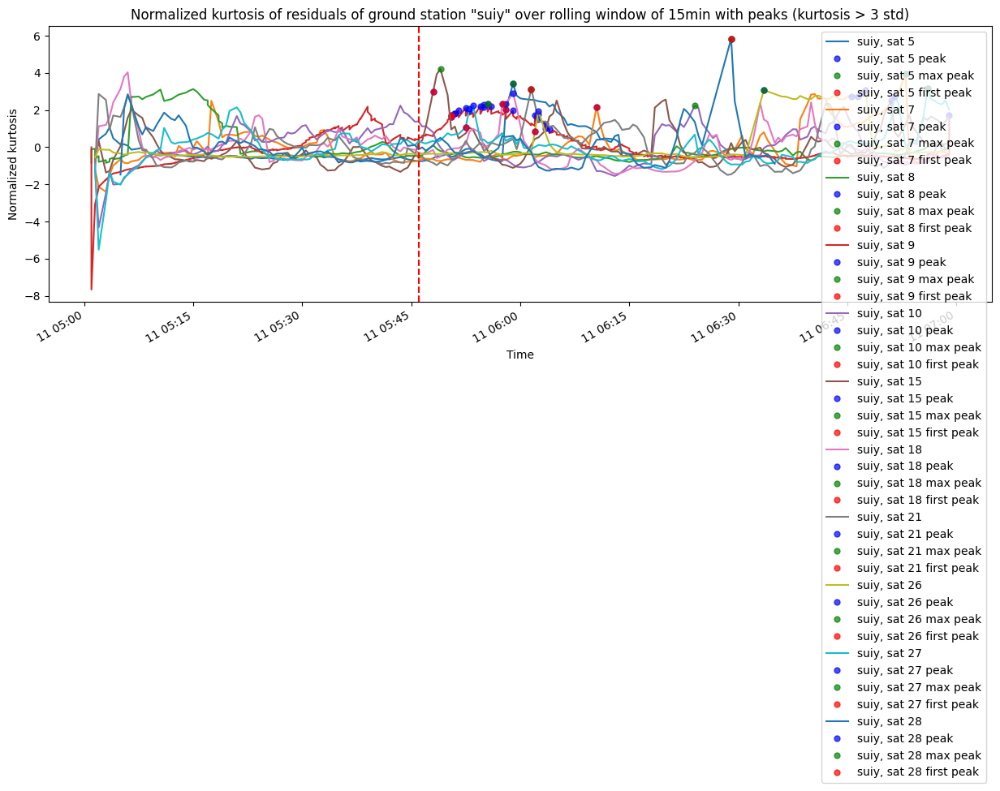

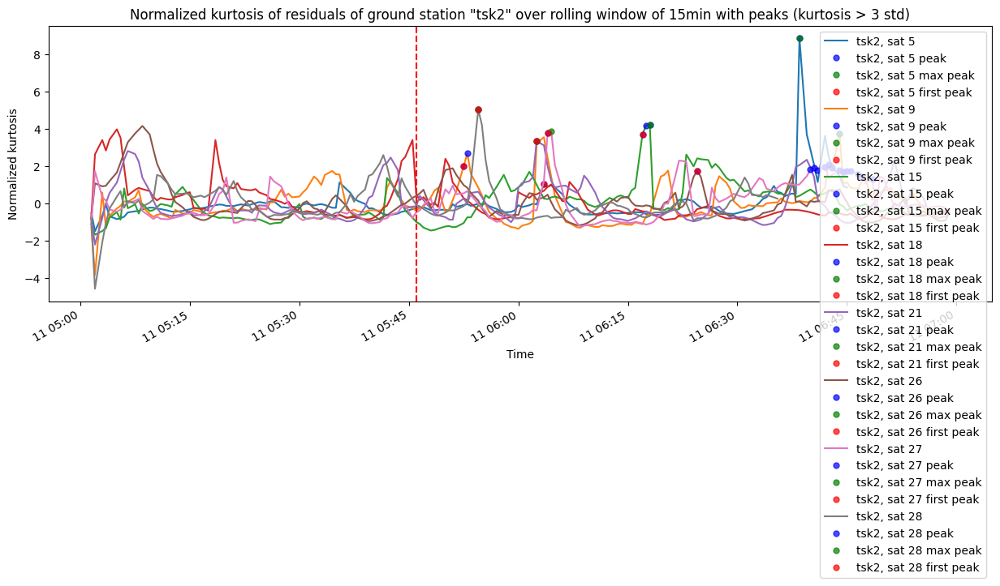

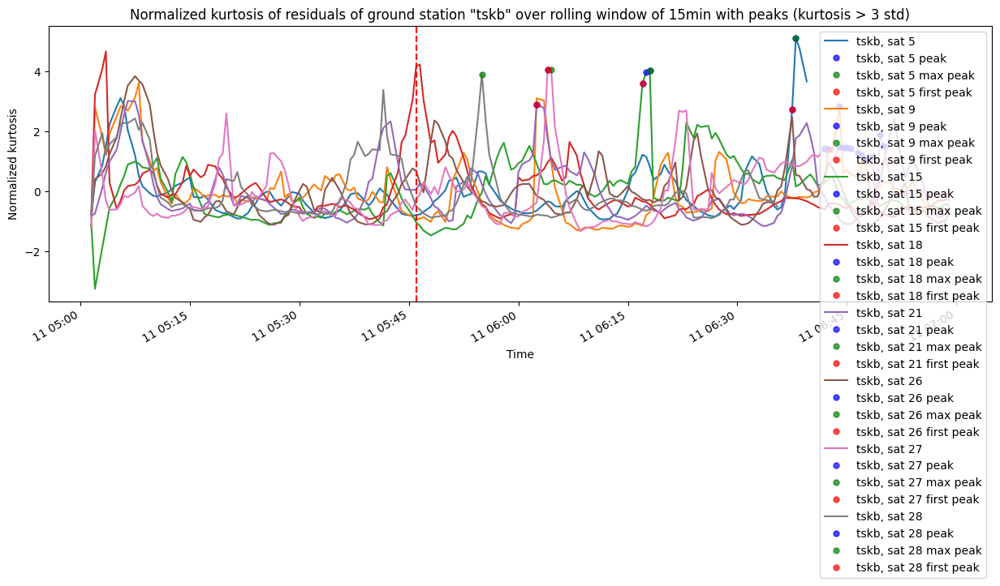

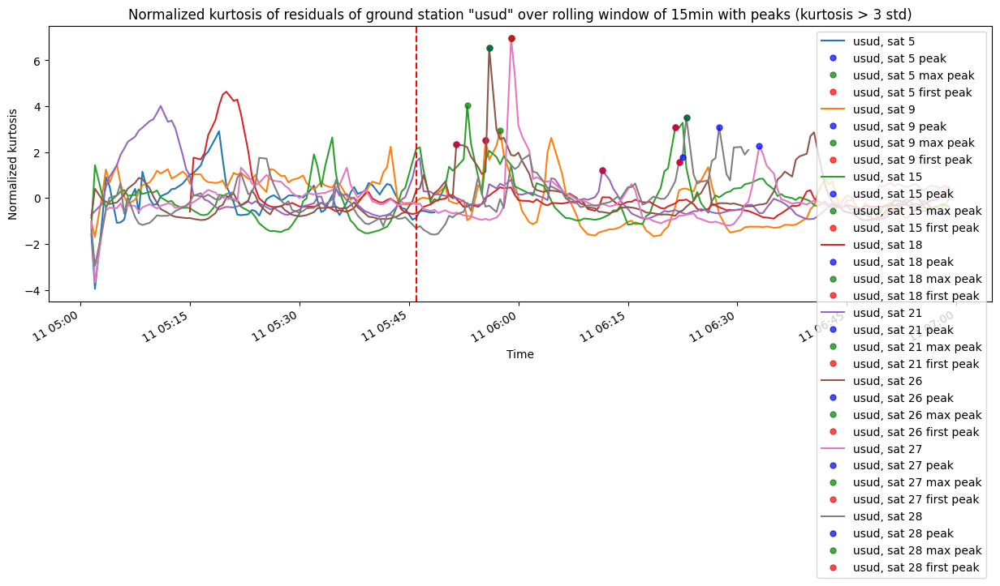

In [91]:
plot_kortosis_peaks(ground_stations)

In [88]:
kurtosis_df.head()

AttributeError: 'tuple' object has no attribute 'head'